**Universidad Galileo**

Statistical Learning I
Tarea 1
Luis Adolfo Martínez Ortiz - 22000352


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import pandas as pd
import datetime

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
if tf.__version__.startswith("2."):
  import tensorflow.compat.v1 as tf
  tf.compat.v1.disable_v2_behavior()
  tf.compat.v1.disable_eager_execution()
  print("Enabled compatitility to tf1.x")

Enabled compatitility to tf1.x


In [ ]:
direccion = "/content/drive/MyDrive/Dataset/"
os.chdir(direccion)

In [ ]:
data = np.load("proyecto_training_data.npy")

(array([  4.,  17.,  79., 187., 349., 354., 273., 152.,  41.,   4.]),
 array([-3.44747765, -2.80195604, -2.15643444, -1.51091283, -0.86539123,
        -0.21986962,  0.42565198,  1.07117359,  1.71669519,  2.3622168 ,
         3.0077384 ]),
 <a list of 10 Patch objects>)

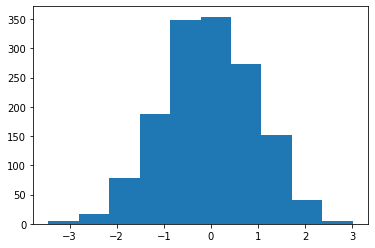

In [ ]:
#distribucion normal de la longitud del dataset para luego dividrlo y tomar el 80% para entrenamiento
distri = np.random.randn(len(data))

plt.hist(distri)

In [ ]:
#obtenemos para el 80% para entrenar

check = (distri<0.80)
training = np.nan_to_num(data[check])   #80% de la data
testing   = np.nan_to_num(data[~check])  #80% de la data

In [ ]:
columna = ["SalePrice","OverallQual","1stFlrSF","TotRmsAbvGrd","YearBuilt","LotFrontage"]
#el de entramiento
dt = pd.DataFrame(training,columns=columna)
# el del test con 20%
dtTestin = pd.DataFrame(testing,columns=columna)

In [ ]:
dt.head()

,SalePrice,OverallQual,1stFlrSF,TotRmsAbvGrd,YearBuilt,LotFrontage
0,208500.0,7.0,856.0,8.0,2003.0,65.0
1,181500.0,6.0,1262.0,6.0,1976.0,80.0
2,140000.0,7.0,961.0,7.0,1915.0,60.0
3,250000.0,8.0,1145.0,9.0,2000.0,84.0
4,143000.0,5.0,796.0,5.0,1993.0,85.0


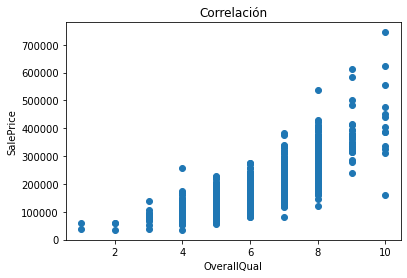

In [ ]:
#Grafica de correlación con la variable con mayor correlación
plt.scatter(dt["OverallQual"], dt["SalePrice"])
plt.xlabel('OverallQual')
plt.ylabel('SalePrice')
plt.title("Correlación")
plt.show()

In [ ]:
def modelo(epochs, imprimir_error_cada, lr, batch_size,x, y):
  x = np.array(x).reshape(-1,1)
  y = np.array(y).reshape(-1,1)
  n = len(y)
  total_iteration = int(n/batch_size)
  #TF 1 
  #tf.reset_default_graph()
  graph = tf.Graph()

  # Definir variables

  tensor_x = tf.placeholder(tf.float64,[batch_size,1])
  tensor_y = tf.placeholder(tf.float64,[batch_size,1])
  tensor_x_1 = tf.concat([tensor_x, tf.ones_like(tensor_x)], axis = 1)

  parameters = tf.Variable(initial_value = tf.zeros((2,1),tf.float64))

  #Calculo de m(x) + b con la funcion vectorizada de matmul
  y_hat = tf.matmul(tensor_x_1, parameters)



  MSE = tf.divide(tf.reduce_sum(tf.square(y_hat - tensor_y)), (2 * n))

  gradients = tf.gradients(MSE, parameters)

  parameters_update = tf.assign(parameters, (tf.add(parameters, tf.scalar_mul(-lr, gradients[0]))))
 
 
  MSE_summary = tf.summary.scalar(tensor = MSE, name = "Error")

  with tf.Session() as session:
    curr_datetime = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    writer = tf.summary.FileWriter("logs_tarea1/" + curr_datetime + 
                                   "_epochs=" + str(epochs) + 
                                   "_lr=" + str(lr) + 
                                   "_batch=" + str(batch_size),
                                   session.graph)
    
    session.run(tf.global_variables_initializer())

    for epoch in range(epochs):
      for i in range(total_iteration):
        muestra_inicio = i*batch_size
        muestra_fin = muestra_inicio + batch_size
        x_mb =  np.array(x[muestra_inicio:muestra_fin]).reshape([-1,1])
        y_mb = np.array(y[muestra_inicio:muestra_fin]).reshape([-1,1])       
        feed_dict = {tensor_x:x_mb, tensor_y:y_mb}
        mb = session.run(parameters_update, feed_dict = feed_dict)
        feed_dict = {tensor_x:x_mb, tensor_y:y_mb}
        writer.add_summary(session.run(MSE_summary, feed_dict = feed_dict), epoch)
    writer.close()
  session.close()
  return (mb)


In [ ]:
# Modelo 1 - Hiperparámetros
epochs = 110
lr = 0.1
batch_size = 1000
imprimir_error_cada = 100
#Model 
mb = modelo(epochs, imprimir_error_cada, lr, batch_size,dt["OverallQual"], dt["SalePrice"])

print("m:", mb[0], "b:", mb[1])

m: [-4.08387499e+46] b: [-6.40410033e+45]


In [ ]:
# Modelo 2 - Hiperparámetros
epochs = 2000
lr = 0.04
batch_size = 1000
imprimir_error_cada = 100

#Model MSE Tensor Flow
mb = modelo(epochs, imprimir_error_cada, lr, batch_size,dt["OverallQual"], dt["SalePrice"])

print("m:", mb[0], "b:", mb[1])

m: [44843.1226496] b: [-92390.35888319]


In [ ]:
# Modelo 4 - Hiperparámetros
epochs = 3000
lr = 0.0005
batch_size = 1000
imprimir_error_cada = 100

#Model MSE Tensor Flow
mb = modelo(epochs, imprimir_error_cada, lr, batch_size,dt["OverallQual"], dt["SalePrice"])

print("m:", mb[0], "b:", mb[1])

m: [30569.2124806] b: [-1366.07491062]


In [ ]:
# Modelo 5 - Hiperparámetros
epochs = 2500
lr = 0.05
batch_size = 1000
imprimir_error_cada = 100

#Model MSE Tensor Flow
mb = modelo(epochs, imprimir_error_cada, lr, batch_size,dt["OverallQual"], dt["SalePrice"])

print("m:", mb[0], "b:", mb[1])

m: [45343.43247147] b: [-95580.81915379]


In [ ]:
# Modelo 6 - Hiperparámetros
epochs = 2000
lr = 0.005
batch_size = 1000
imprimir_error_cada = 100

#Model MSE Tensor Flow
mb = modelo(epochs, imprimir_error_cada, lr, batch_size,dt["OverallQual"], dt["SalePrice"])

print("m:", mb[0], "b:", mb[1])

m: [34943.33843964] b: [-29259.74095679]


In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs_tarea1

Output hidden; open in https://colab.research.google.com to view.

##Conclusión

Observando los modelos manipulando los parametros, elejimos el modelo número dos: con los siguientes paramentros

epoch  = 2000
lr = 0.04

m: [44843.1226496] b: [-92390.35888319]



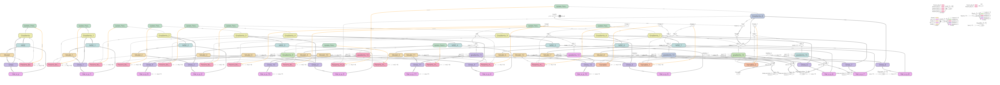